# Predicting preferred destination  based on taste and preference

The goal is to build a machine learning model that can predict hotel ratings based on customer reviews, budget, specific locations, and the type of residence. The dataset is scraped from TripAdvisor and it contains information about various hotels, including their ratings, reviews, amenities, pricing, geographical coordinates, and residence types (e.g., hotel, bed and breakfast, specialty lodging). By analyzing the text reviews along with these additional factors, the objective is to develop a model that can accurately predict the ratings of new, unseen hotels based on customer reviews, budget constraints, location preferences, and residence type.

Approach:

Data Preprocessing: Clean and preprocess the text reviews by removing stopwords, punctuation, and performing tokenization. Convert the text data into a numerical representation suitable for modeling. Handle missing values, if any, in the budget, location, and residence type columns.

Feature Engineering: Extract additional features from the dataset, such as review sentiment scores, review length, and any other relevant information. Engineer new features related to budget, location, and residence type, such as price range categories, geographical distance from landmarks, and one-hot encoding of residence types.

Model Selection: Experiment with different supervised learning models, such as linear regression, decision trees, random forests, or neural networks, to find the best model for predicting hotel ratings considering customer reviews, budget, location, and residence type. Evaluate the models using appropriate evaluation metrics like mean squared error (MSE) or mean absolute error (MAE).

Model Training and Evaluation: Split the dataset into training and testing sets. Train the selected model on the training set and evaluate its performance on the testing set. Fine-tune the model parameters to improve its accuracy. Perform cross-validation to assess the model's generalization capabilities.

In [1]:
import pandas as pd
import json
import glob
import re

In [2]:

def read_json_files(json_files):
    dfs = []
    for file in json_files:
        with open(file, encoding='utf-8') as f:
            json_data = json.load(f)
            df = pd.DataFrame(json_data)
            dfs.append(df)
    return pd.concat(dfs)

json_files = ['..\Data\drc.json', '..\Data\egypt.json', '..\Data\ethiopia.json',
                '..\Data\kenya.json', '..\Data\Madagascar.json', '..\Data\morocco.json',
                r'..\Data\nigeria.json', r'..\Data\rwanda.json', '..\Data\seychelles.json',
                r'..\Data\tanzania.json', r'..\Data\uganda.json', r'..\Data\namibia.json',
                '..\Data\south_africa.json', '..\Data\malawi.json', '..\Data\Senegal.json',
                '..\Data\zambia.json', '..\Data\Ghana.json', '..\Data\Botswana.json',
                '..\Data\capeverde.json']

df = read_json_files(json_files)


In [3]:
df

,id,type,category,subcategories,name,locationString,description,image,photoCount,awards,...,establishmentTypes,ownersTopReasons,localLangCode,guideFeaturedInCopy,rentalDescriptions,photos,bedroomInfo,bathroomInfo,bathCount,baseDailyRate
0,2704993,ATTRACTION,attraction,[Nature & Parks],Congoloisirs,Kinshasa,None,https://media-cdn.tripadvisor.com/media/photo-...,9,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1536776,ATTRACTION,attraction,[Nature & Parks],Okapi Wildlife Reserve,Orientale Province,None,https://media-cdn.tripadvisor.com/media/photo-...,3,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,13203729,ATTRACTION,attraction,"[Shopping, Food & Drink]",Marche Nouveau DAIPN,Kinshasa,None,https://media-cdn.tripadvisor.com/media/photo-...,12,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8661504,HOTEL,hotel,[Specialty Lodging],Bukima Tented Camp,"Rumangabo, North Kivu Province",Just outside the Virunga National Park boundar...,https://media-cdn.tripadvisor.com/media/photo-...,79,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10414108,HOTEL,hotel,[Specialty Lodging],"Tchegera Island Tented Camp, Virunga National ...","Goma, North Kivu Province",None,https://media-cdn.tripadvisor.com/media/photo-...,109,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,12216827,HOTEL,hotel,[Specialty Lodging],Casa Santos Pinto,"Curral das Vacas, Santo Antao",None,None,0,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1274,23200009,HOTEL,hotel,[Bed and Breakfast],Kelly GuestHouse - Lovely Bedroom - Plateau Ci...,"Praia, Santiago",None,https://media-cdn.tripadvisor.com/media/partne...,0,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1275,13423426,HOTEL,hotel,[Bed and Breakfast],Luz Esperanca,"Pedra Badejo, Santiago",None,None,0,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1276,12957229,HOTEL,hotel,[Specialty Lodging],Pensao Entre Nos,"Tarrafal, Santiago",None,None,0,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.isnull().sum()

id                   0
type                 0
category             0
subcategories     1339
name                 0
                 ...  
photos           34497
bedroomInfo      34497
bathroomInfo     34497
bathCount        34497
baseDailyRate    34568
Length: 65, dtype: int64

In [5]:
df.columns

Index(['id', 'type', 'category', 'subcategories', 'name', 'locationString',
       'description', 'image', 'photoCount', 'awards', 'rankingPosition',
       'rating', 'rawRanking', 'phone', 'address', 'addressObj', 'localName',
       'localAddress', 'email', 'latitude', 'longitude', 'webUrl', 'website',
       'rankingString', 'rankingDenominator', 'neighborhoodLocations',
       'nearestMetroStations', 'ancestorLocations', 'ratingHistogram',
       'numberOfReviews', 'reviewTags', 'reviews', 'booking', 'offerGroup',
       'subtype', 'hotelClass', 'amenities', 'numberOfRooms', 'priceLevel',
       'priceRange', 'roomTips', 'checkInDate', 'checkOutDate', 'offers',
       'hotelClassAttribution', 'isClosed', 'isLongClosed', 'openNowText',
       'cuisines', 'mealTypes', 'dishes', 'features', 'dietaryRestrictions',
       'hours', 'menuWebUrl', 'establishmentTypes', 'ownersTopReasons',
       'localLangCode', 'guideFeaturedInCopy', 'rentalDescriptions', 'photos',
       'bedroomInfo', '

Here's a breakdown of what each column might represent based on the names:
id: Unique identifier for each item.
type: Type of the item.
category: Category of the item.
subcategories: Subcategories associated with the item.
name: Name of the item.
locationString: String representation of the location of the item.
description: Description or details about the item.
image: Image associated with the item.
photoCount: Number of photos available for the item.
awards: Awards received by the item.
rankingPosition: Ranking position of the item.
rating: Rating of the item.
rawRanking: Raw ranking of the item.
phone: Phone number associated with the item.
address: Address of the item.
addressObj: Address information in object format.
localName: Local name of the item.
localAddress: Local address of the item.
localLangCode: Language code for the local information.
email: Email address associated with the item.
latitude: Latitude coordinate of the item's location.
longitude: Longitude coordinate of the item's location.
webUrl: URL associated with the item.
website: Website URL of the item.
rankingString: Ranking information in string format.
rankingDenominator: Denominator for the ranking.
neighborhoodLocations: Locations of the item in the neighborhood.
nearestMetroStations: Nearest metro stations to the item.
ancestorLocations: Ancestor locations of the item.
ratingHistogram: Histogram data for the item's ratings.
numberOfReviews: Number of reviews for the item.
reviewTags: Tags associated with the reviews.
reviews: Reviews of the item.
booking: Booking information for the item.
offerGroup: Group of offers associated with the item.
subtype: Subtype or specific type of the item.
hotelClass: Class or rating of a hotel item.
hotelClassAttribution: Attribution information for the hotel's class.
amenities: Amenities available at the item.
numberOfRooms: Number of rooms available (for hotels).
priceLevel: Price level or range of the item.
priceRange: Price range of the item.
roomTips: Tips or recommendations for rooms (for hotels).
checkInDate: Date for check-in (for hotels).
checkOutDate: Date for check-out (for hotels).
offers: Offers associated with the item.
guideFeaturedInCopy: Information about guides featuring the item.
isClosed: Indicates if the item is closed.
isLongClosed: Indicates if the item has been closed for a long time.
openNowText: Text indicating if the item is currently open.
cuisines: Cuisines offered (for restaurants).
mealTypes: Types of meals available (for restaurants).
dishes: Dishes served (for restaurants).
features: Features or highlights of the item.
dietaryRestrictions: Dietary restrictions or considerations.
hours: Operating hours of the item.
menuWebUrl: URL for the menu (for restaurants).
establishmentTypes: Types of establishments.
ownersTopReasons: Top reasons provided by owners.
rentalDescriptions: Descriptions related to rentals.
photos: Photos associated with the item.
bedroomInfo: Information about bedrooms (for accommodations).
bathroomInfo: Information about bathrooms (for accommodations).
bathCount: Number of bathrooms (for accommodations).
baseDailyRate: Base daily rate (for accommodations).

In [6]:
df.reviewTags.value_counts()

[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [7]:
# Check null values and filter columns with more than 4000 null values
null_counts = df.isnull().sum()
columns_above_threshold = null_counts[null_counts > 10000].index

# Print the columns with more than 4000 null values
list(columns_above_threshold)


['description',
 'phone',
 'localAddress',
 'email',
 'website',
 'booking',
 'offerGroup',
 'subtype',
 'hotelClass',
 'numberOfRooms',
 'priceLevel',
 'priceRange',
 'roomTips',
 'checkInDate',
 'checkOutDate',
 'offers',
 'hotelClassAttribution',
 'isClosed',
 'isLongClosed',
 'openNowText',
 'cuisines',
 'mealTypes',
 'dishes',
 'features',
 'dietaryRestrictions',
 'hours',
 'menuWebUrl',
 'establishmentTypes',
 'ownersTopReasons',
 'localLangCode',
 'guideFeaturedInCopy',
 'rentalDescriptions',
 'photos',
 'bedroomInfo',
 'bathroomInfo',
 'bathCount',
 'baseDailyRate']

In [8]:
# we will drop the following columns because they do not have any contribution to our objectives.
# some also contain too many null values to fill. 
cols_to_drop = columns_above_threshold

df.drop(columns=cols_to_drop, inplace=True)

In [9]:
list(df.columns)

['id',
 'type',
 'category',
 'subcategories',
 'name',
 'locationString',
 'image',
 'photoCount',
 'awards',
 'rankingPosition',
 'rating',
 'rawRanking',
 'address',
 'addressObj',
 'localName',
 'latitude',
 'longitude',
 'webUrl',
 'rankingString',
 'rankingDenominator',
 'neighborhoodLocations',
 'nearestMetroStations',
 'ancestorLocations',
 'ratingHistogram',
 'numberOfReviews',
 'reviewTags',
 'reviews',
 'amenities']

In [10]:
df[['locationString','rankingPosition','rawRanking','rankingString','rankingDenominator']]

,locationString,rankingPosition,rawRanking,rankingString,rankingDenominator
0,Kinshasa,17.0,2.778074,#17 of 105 things to do in Kinshasa,105
1,Orientale Province,1.0,2.751658,#1 of 4 things to do in Orientale Province,4
2,Kinshasa,21.0,2.773659,#21 of 105 things to do in Kinshasa,105
3,"Rumangabo, North Kivu Province",2.0,3.351389,#2 of 3 Specialty lodging in Rumangabo,3
4,"Goma, North Kivu Province",1.0,3.464931,#1 of 17 Specialty lodging in Goma,17
...,...,...,...,...,...
1273,"Curral das Vacas, Santo Antao",NaN,NaN,None,None
1274,"Praia, Santiago",NaN,NaN,None,None
1275,"Pedra Badejo, Santiago",NaN,NaN,None,None
1276,"Tarrafal, Santiago",NaN,NaN,None,None


In [23]:
df[['name','rankingString', 'type']]

,name,rankingString,type
0,Congoloisirs,#17 of 105 things to do in Kinshasa,ATTRACTION
1,Okapi Wildlife Reserve,#1 of 4 things to do in Orientale Province,ATTRACTION
2,Marche Nouveau DAIPN,#21 of 105 things to do in Kinshasa,ATTRACTION
3,Bukima Tented Camp,#2 of 3 Specialty lodging in Rumangabo,HOTEL
4,"Tchegera Island Tented Camp, Virunga National ...",#1 of 17 Specialty lodging in Goma,HOTEL
...,...,...,...
1273,Casa Santos Pinto,None,HOTEL
1274,Kelly GuestHouse - Lovely Bedroom - Plateau Ci...,None,HOTEL
1275,Luz Esperanca,None,HOTEL
1276,Pensao Entre Nos,None,HOTEL


In [24]:

# Create new columns
df['RankingType'] = ""
df['Location'] = ""
df['Numerator'] = ""
df['Denominator'] = ""

# Iterate through the rows and extract the information
for index, row in df.iterrows():
    # Check if the value is NaN
    if pd.isnull(row['rankingString']):
        continue
    
    # Use regular expressions to extract the information
    match = re.match(r'#(\d+)\s+of\s+(\d+)\s+(.*?)\s+in\s+(.*?)$', row['rankingString'])
    
    # Check if the match is successful
    if match:
        numerator = match.group(1)
        denominator = match.group(2)
        ranking_type = match.group(3)
        location = match.group(4)
        
        # Update the new columns
        df.at[index, 'RankingType'] = ranking_type
        df.at[index, 'Location'] = location
        df.at[index, 'Numerator'] = numerator
        df.at[index, 'Denominator'] = denominator



In [25]:
df.columns

Index(['id', 'type', 'category', 'subcategories', 'name', 'locationString',
       'image', 'photoCount', 'awards', 'rankingPosition', 'rating',
       'rawRanking', 'address', 'addressObj', 'localName', 'latitude',
       'longitude', 'webUrl', 'rankingString', 'rankingDenominator',
       'neighborhoodLocations', 'nearestMetroStations', 'ancestorLocations',
       'ratingHistogram', 'numberOfReviews', 'reviewTags', 'reviews',
       'amenities', 'RankingType', 'Location', 'Numerator', 'Denominator'],
      dtype='object')

In [26]:
df.RankingType.value_counts()

B&Bs / Inns                  11523
Specialty lodging             9814
hotels                        4896
things to do                  3306
Boat Tours & Water Sports     1501
Outdoor Activities             950
Tours                          817
B&B / Inn                      633
Transportation                 608
Shopping                       361
Nightlife                      323
Food & Drink                   304
hotel                          299
Spas & Wellness                247
Classes & Workshops            133
Fun & Games                     76
Concerts & Shows                19
Museums                         19
                                 7
Name: RankingType, dtype: int64

In [27]:
# Define the mappings to combine similar values
mappings = {
    'hotel': 'hotels',
    'B&B / Inn': 'B&Bs / Inns',
    'Sights & Landmarks': 'Nature & Parks',
    'Fun & Games': 'Outdoor Activities',
    'Boat Tours & Water Sports': 'Water & Amusement Parks',
    'Traveler Resources': 'Shopping',
    'Concerts & Shows': 'Nightlife',
    'Food & Drink': 'places to eat',
    'Nature & Parks': 'things to do',
    'Museums': 'things to do',
    'Tours' : 'things to do',
    'Outdoor Activities': 'things to do',
    'B&Bs / Inns': 'Specialty lodging'
}

# Replace the values in the 'Ranking Type' column
df['RankingType'] = df['RankingType'].replace(mappings)

In [28]:
df

,id,type,category,subcategories,name,locationString,image,photoCount,awards,rankingPosition,...,ancestorLocations,ratingHistogram,numberOfReviews,reviewTags,reviews,amenities,RankingType,Location,Numerator,Denominator
0,2704993,ATTRACTION,attraction,[Nature & Parks],Congoloisirs,Kinshasa,https://media-cdn.tripadvisor.com/media/photo-...,9,[],17.0,...,"[{'id': '294187', 'name': 'Kinshasa', 'abbrevi...","{'count1': 0, 'count2': 0, 'count3': 4, 'count...",9,[],[],NaN,things to do,Cidade Velha,1,9
1,1536776,ATTRACTION,attraction,[Nature & Parks],Okapi Wildlife Reserve,Orientale Province,https://media-cdn.tripadvisor.com/media/photo-...,3,[],1.0,...,"[{'id': '1536771', 'name': 'Orientale Province...","{'count1': 0, 'count2': 0, 'count3': 0, 'count...",2,[],[],NaN,things to do,Praia,1,20
2,13203729,ATTRACTION,attraction,"[Shopping, Food & Drink]",Marche Nouveau DAIPN,Kinshasa,https://media-cdn.tripadvisor.com/media/photo-...,12,[],21.0,...,"[{'id': '294187', 'name': 'Kinshasa', 'abbrevi...","{'count1': 0, 'count2': 0, 'count3': 0, 'count...",3,[],[],NaN,things to do,Boa Vista,4,30
3,8661504,HOTEL,hotel,[Specialty Lodging],Bukima Tented Camp,"Rumangabo, North Kivu Province",https://media-cdn.tripadvisor.com/media/photo-...,79,[],2.0,...,"[{'id': '3656749', 'name': 'Rumangabo', 'abbre...","{'count1': 1, 'count2': 0, 'count3': 0, 'count...",34,[],[],"(Restaurant, Mountain View)",things to do,Boa Vista,3,30
4,10414108,HOTEL,hotel,[Specialty Lodging],"Tchegera Island Tented Camp, Virunga National ...","Goma, North Kivu Province",https://media-cdn.tripadvisor.com/media/photo-...,109,[],1.0,...,"[{'id': '303843', 'name': 'Goma', 'abbreviatio...","{'count1': 0, 'count2': 0, 'count3': 1, 'count...",29,"[{'text': 'gorilla trekking', 'reviews': 3}, {...",[],"(Multilingual Staff, Restaurant, Bar/Lounge, F...",Specialty lodging,Cha das Caldeiras,1,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,12216827,HOTEL,hotel,[Specialty Lodging],Casa Santos Pinto,"Curral das Vacas, Santo Antao",None,0,[],NaN,...,"[{'id': '12880045', 'name': 'Curral das Vacas'...","{'count1': 0, 'count2': 0, 'count3': 0, 'count...",0,[],[],"(Shuttle Bus Service, Restaurant, Bar/Lounge, ...",Specialty lodging,Sekondi-Takoradi,4,33
1274,23200009,HOTEL,hotel,[Bed and Breakfast],Kelly GuestHouse - Lovely Bedroom - Plateau Ci...,"Praia, Santiago",https://media-cdn.tripadvisor.com/media/partne...,0,[],NaN,...,"[{'id': '293775', 'name': 'Praia', 'abbreviati...","{'count1': 0, 'count2': 0, 'count3': 0, 'count...",0,[],[],(),Specialty lodging,Accra,74,363
1275,13423426,HOTEL,hotel,[Bed and Breakfast],Luz Esperanca,"Pedra Badejo, Santiago",None,0,[],NaN,...,"[{'id': '1601793', 'name': 'Pedra Badejo', 'ab...","{'count1': 0, 'count2': 0, 'count3': 0, 'count...",0,[],[],"(Kids Activities, Free parking, Airport transp...",Specialty lodging,Bolgatanga,3,19
1276,12957229,HOTEL,hotel,[Specialty Lodging],Pensao Entre Nos,"Tarrafal, Santiago",None,0,[],NaN,...,"[{'id': '482851', 'name': 'Tarrafal', 'abbrevi...","{'count1': 0, 'count2': 0, 'count3': 0, 'count...",0,[],[],"(Kids Activities, Free parking, Airport transp...",Specialty lodging,Techiman,1,18


In [29]:
df.RankingType

0            things to do
1            things to do
2            things to do
3            things to do
4       Specialty lodging
              ...        
1273    Specialty lodging
1274    Specialty lodging
1275    Specialty lodging
1276    Specialty lodging
1277    Specialty lodging
Name: RankingType, Length: 35836, dtype: object

In [32]:
empty_rows = df[df['RankingType'].isnull() | df['RankingType'].eq('')]
empty_rows[['RankingType', 'name', 'type']]

,RankingType,name,type
2902,,5 Options Guest House,HOTEL
2919,,Gourikwa Nature Reserve,HOTEL
3148,,V&A Waterfront Marina Residential Estate,HOTEL
3224,,The Salt House,HOTEL
2902,,Jam Guesthouse,HOTEL
2919,,Yaa Agyakoma Memorial Guest house,HOTEL
3148,,Ramvis Lodge,HOTEL


In [33]:
speciality_lodging_rows = empty_rows[empty_rows['type'] == 'HOTEL'][['RankingType', 'name', 'type']]
speciality_lodging_rows

,RankingType,name,type
2902,,5 Options Guest House,HOTEL
2919,,Gourikwa Nature Reserve,HOTEL
3148,,V&A Waterfront Marina Residential Estate,HOTEL
3224,,The Salt House,HOTEL
2902,,Jam Guesthouse,HOTEL
2919,,Yaa Agyakoma Memorial Guest house,HOTEL
3148,,Ramvis Lodge,HOTEL


In [34]:
null_values = df[df['RankingType'].isna()]
null_values

,id,type,category,subcategories,name,locationString,image,photoCount,awards,rankingPosition,...,ancestorLocations,ratingHistogram,numberOfReviews,reviewTags,reviews,amenities,RankingType,Location,Numerator,Denominator


In [35]:
# Replace NaN values with "bathroom only" where type is "attraction"
df.loc[(df['type'] == 'RESTAURANT') & (df['amenities'].isna()), 'amenities'] = 'restaurant'


In [36]:
df.loc[(df['type'] == 'ATTRACTION') & (df['amenities'].isna()), 'amenities'] = 'bathroom only'

In [37]:
df['amenities'] = df['amenities'].apply(lambda x: ', '.join(x) if isinstance(x, list) else '')

In [38]:
df['amenities'].isnull().value_counts()

False    35836
Name: amenities, dtype: int64

In [40]:

hotel_rows = df[df['type'] == 'RESTAURANT']
hotel_amenities = hotel_rows['amenities']
hotel_amenities

59      
60      
61      
62      
64      
      ..
396     
398     
400     
434     
436     
Name: amenities, Length: 416, dtype: object

In [41]:
df[['type', 'amenities']]

,type,amenities
0,ATTRACTION,
1,ATTRACTION,
2,ATTRACTION,
3,HOTEL,
4,HOTEL,
...,...,...
1273,HOTEL,
1274,HOTEL,
1275,HOTEL,
1276,HOTEL,


In [42]:
df.amenities

0        
1        
2        
3        
4        
       ..
1273     
1274     
1275     
1276     
1277     
Name: amenities, Length: 35836, dtype: object

In [44]:
df['amenities'] = df['amenities'].apply(lambda x: tuple(x) if isinstance(x, list) else x)
grouped_counts = df[['name', 'amenities']].groupby('amenities').value_counts()

In [45]:
df.columns

Index(['id', 'type', 'category', 'subcategories', 'name', 'locationString',
       'image', 'photoCount', 'awards', 'rankingPosition', 'rating',
       'rawRanking', 'address', 'addressObj', 'localName', 'latitude',
       'longitude', 'webUrl', 'rankingString', 'rankingDenominator',
       'neighborhoodLocations', 'nearestMetroStations', 'ancestorLocations',
       'ratingHistogram', 'numberOfReviews', 'reviewTags', 'reviews',
       'amenities', 'RankingType', 'Location', 'Numerator', 'Denominator'],
      dtype='object')

## Choropleth Map:

In [46]:
import plotly.express as px

# Assuming you have latitude and longitude columns in your DataFrame
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="rating",
                        hover_name="name", hover_data=["category", "rating"],
                        mapbox_style="open-street-map")
fig.show()


## Bar Chart

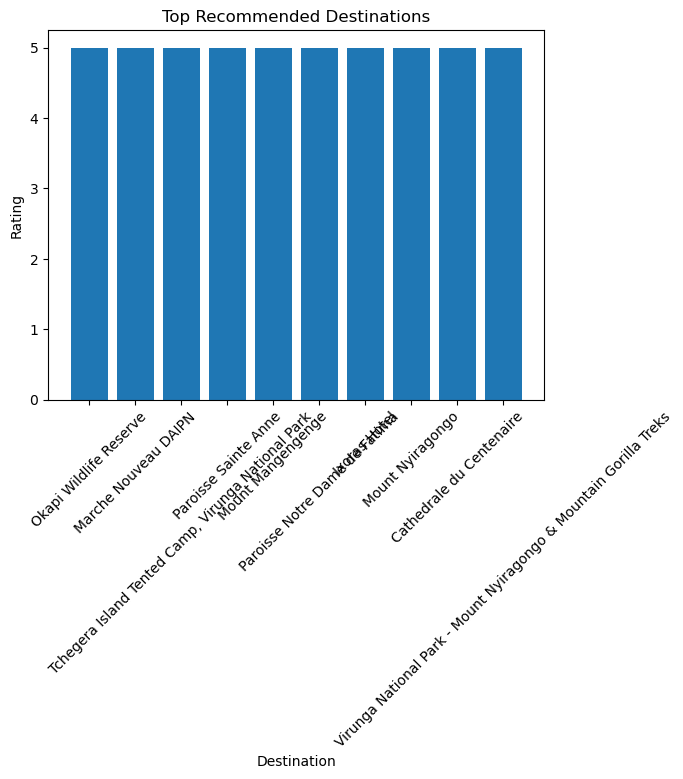

In [49]:
import matplotlib.pyplot as plt

top_destinations = df.nlargest(10, "rating")  # Select top 10 destinations based on rating
plt.bar(top_destinations["name"], top_destinations["rating"])
plt.xlabel("Destination")
plt.ylabel("Rating")
plt.xticks(rotation=45)
plt.title("Top Recommended Destinations")
plt.show()


## Word Cloud

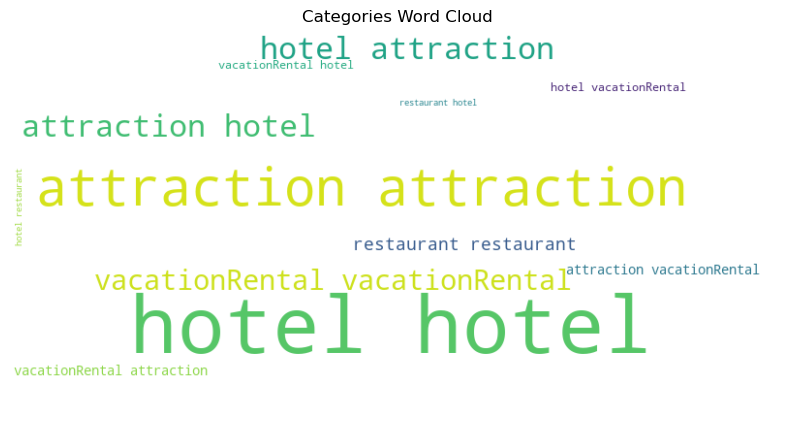

In [50]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

text = " ".join(df["category"].dropna().astype(str))
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Categories Word Cloud")
plt.show()


## Scatter Plot

In [51]:
import matplotlib.pyplot as plt

plt.scatter(df["popularity"], df["rating"])
plt.xlabel("Popularity")
plt.ylabel("Rating")
plt.title("Popularity vs Rating")
plt.show()


KeyError: 'popularity'

## Network Graph

In [52]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.from_pandas_edgelist(df, source="name", target="subcategories")

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, with_labels=True, node_color="skyblue", node_size=1500,
                 edge_color="gray", linewidths=0.5, font_size=10)
plt.title("Travel Destinations Network Graph")
plt.axis("off")
plt.show()


TypeError: unhashable type: 'list'

In [ ]:
## Histogram

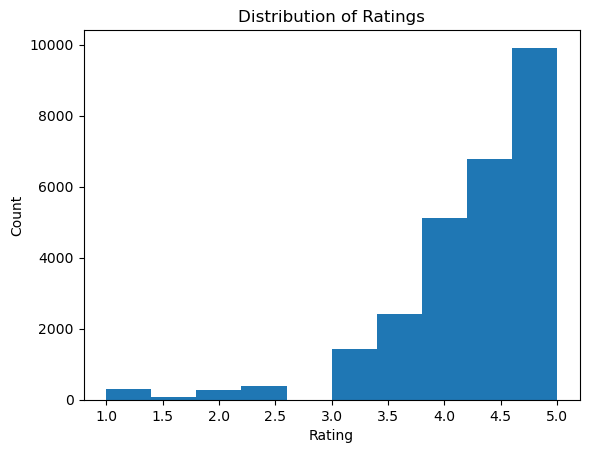

In [53]:
import matplotlib.pyplot as plt

plt.hist(df["rating"], bins=10)
plt.xlabel("Rating")
plt.ylabel("Count")
plt.title("Distribution of Ratings")
plt.show()


In [ ]:
## Radar Chart

In [54]:
import matplotlib.pyplot as plt
import numpy as np

attributes = ["popularity", "cost", "amenities", "rating"]
values = df.loc[0, attributes].values  # Assuming you want to plot the attributes of the first destination

angles = np.linspace(0, 2 * np.pi, len(attributes), endpoint=False).tolist()
values += values[:1]  # Close the radar plot
angles += angles[:1]  # Close the radar plot

plt.polar(angles, values, marker="o")
plt.fill(angles, values, alpha=0.25)
plt.xticks(angles[:-1], attributes)
plt.title("Destination Attributes Comparison")
plt.show()


KeyError: "['popularity', 'cost'] not in index"

In [ ]:
# data.to_csv(r"E:\Documents\data science\Capstone\data1")

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
import pandas_profiling


In [ ]:
profile_trip = pandas_profiling.ProfileReport(df)
profile_trip.to_file("df.html")